# 1.Importing packages and collecting data

In [2]:
##Basic packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats  
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.multicomp import pairwise_tukeyhsd
##Data visualisation packages
import plotly.graph_objs as go
from plotly.subplots import make_subplots
## Model packages
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection import KFold ,GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.feature_selection import RFE, f_regression
import xgboost as xgb

In [3]:
banking=pd.read_csv("D:/DS Training Videos/ML algo script/1.Linear Regression\Bank dataset/Loss_Given_Default.csv")

# Find missing values

In [4]:
banking.isnull().sum()

Ac_No                  0
Age                    0
Years of Experience    0
Number of Vehicles     0
Gender                 0
Married                0
Losses in Thousands    0
dtype: int64

# 2.Variable description and identification

# 2.1. Segregate Categorical and Continuous variables

   <b> Categorical variables</b>
    - Number of vehicles
    - Gender
    - Married
   <b> Continuous variables</b>
    - Age
    - years of experience

# 2.2.Data types

In [5]:
banking.dtypes

Ac_No                    int64
Age                      int64
Years of Experience      int64
Number of Vehicles       int64
Gender                  object
Married                 object
Losses in Thousands    float64
dtype: object

# 3.Univariate Analysis

# 3.1. Categorical variables

   <b> Countplot</b>
  - Frequency of each category is plotted

In [6]:
def plotFrequency(variable):
    """Plots absolute and relative frequency of a avriable."""
    
    # Calculates absolute frequency
    absFreq = variable.value_counts()
    
    # Calculates relative frequency
    relFreq = variable.value_counts(normalize=True).round(4)*100
    
    # Creates a dataframe off absolute and relative frequency
    df = pd.DataFrame({
        "absoluteFrequency":absFreq,
        "relativeFrequency":relFreq
    })
    
    # Create two subplots of bar chart
    fig=make_subplots(
        rows=1, 
        cols=2,
        vertical_spacing=0.3,
        subplot_titles=("Absolute Frequency", "Relative Frequency"),
        print_grid=False) # This suppresses "This is the format of your plot grid:" text from popping out.

    # Add trace for absolute frequency
    fig.add_trace(
        go.Bar(
        y=df.index, 
        x=df.absoluteFrequency,
        orientation="h",
        text=df.absoluteFrequency,
        hoverinfo="x+y",
        textposition="auto", 
        name="Abs Freq",
        textfont=dict(family="sans serif",size=14),
        marker = dict(color=df.absoluteFrequency, colorscale="Rainbow")),
        row=1,
        col=1
        )

    # Add another trace for relative frequency
    fig.add_trace(
        go.Bar(y=df.index,
        x=df.relativeFrequency.round(2),
        orientation="h",
        text=df.relativeFrequency.round(2),
        hoverinfo="x+y",
        textposition="auto", 
        name="Rel Freq(%)",
        textfont=dict(family="sans serif",size=15),
        marker=dict(color=df.relativeFrequency.round(2), colorscale="Rainbow")),
        row=1,
        col=2
        )

    # Update the layout. Add title, dimension, and background color
    fig.layout.update(
        height=600, 
        width=970,
        hovermode="closest",
        title_text=f"Absolute and Relative Frequency of {variable.name}",showlegend=False,
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )

    # Set y-axis title in bold
    fig.layout.yaxis1.update(title=f"<b>{variable.name}</b>")
    
    # Set x-axes titles in bold
    fig.layout.xaxis1.update(title="<b>Abs Freq</b>")
    fig.layout.xaxis2.update(title="<b>Rel Freq(%)</b>")
    # or, fig["layout"]["xaxis2"].update(title="<b>Rel Freq(%)</b>")
    return fig.show()

# 3.1.1. Gender

In [7]:
plotFrequency(banking.Gender)

# 3.1.2 Number of vehicles

In [8]:
plotFrequency(banking['Number of Vehicles'])

# 3.1.3 Married

In [9]:
plotFrequency(banking.Married)

<b>Conclusion</b>
- Gender is almost equally split
- Number of vehicles 2 ,3 is more
- Married is almost equally split

# 3.2 Continuous variables

   <b>Kernel Density Plots.</b>
    They can be considered a smoothed version of the histogram. One advantage of density plot over histogram is that its shape of distribution isn't affected by the number of bins used.

In [10]:
def plotHistogram(variable):
    """Plots histogram and density plot of a variable."""
    
    # Create subplot object.
    fig = make_subplots(
        rows=2,
        cols=1,
        print_grid=False,
    subplot_titles=(f"Distribution of {variable.name} with Histogram", f"Distribution of {variable.name} with Density Plot"))
    
    # This is a count histogram
    fig.add_trace(
        go.Histogram(
            x = variable,
            hoverinfo="x+y",
            marker = dict(color = "chocolate")
        ),
    row=1,col=1)
    
    # This is a density histogram
    fig.add_trace(
        go.Histogram(
            x = variable,
            hoverinfo="x+y",
            histnorm = "density",
            marker = dict(color = "darkred")
        ),
    row=2,col=1)
    
    # Update layout
    fig.layout.update(
        height=800, 
        width=870,
        hovermode="closest",
        showlegend=False,
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )
    
    # Update axes
    fig.layout.yaxis1.update(title="<b>Abs Frequency</b>")
    fig.layout.yaxis2.update(title="<b>Density(%)</b>")
    fig.layout.xaxis2.update(title=f"<b>{variable.name}</b>")
    return fig.show()
    

    
'''#2.Calculate descriptive statistics.'''
def calculateSummaryStats(variable):
    stats = variable.describe()
    skewness = pd.Series(variable.skew(), index = ["skewness"])
    statsDf = pd.DataFrame(pd.concat([skewness, stats], sort = False), columns = [variable.name])
    statsDf = statsDf.reset_index().rename(columns={"index":"summaryStats"})
    return display(statsDf.round(2))

# 3.2.1 Age

In [11]:
plotHistogram(banking.Age)

In [12]:
calculateSummaryStats(banking.Age)

,summaryStats,Age
0,skewness,0.05
1,count,15290.00
2,mean,42.33
3,std,18.28
4,min,16.00
5,25%,24.00
6,50%,42.00
7,75%,61.00
8,max,70.00


# 3.2.2 Years of experience

In [13]:
plotHistogram(banking['Years of Experience'])

In [14]:
calculateSummaryStats(banking['Years of Experience'])

,summaryStats,Years of Experience
0,skewness,0.10
1,count,15290.00
2,mean,23.73
3,std,17.85
4,min,0.00
5,25%,6.00
6,50%,23.00
7,75%,42.00
8,max,53.00


In [15]:
plotHistogram(banking['Losses in Thousands']**(1/2))

In [16]:
calculateSummaryStats(banking['Losses in Thousands']**(1/2))

,summaryStats,Losses in Thousands
0,skewness,0.41
1,count,15290.00
2,mean,18.79
3,std,6.08
4,min,3.54
5,25%,15.05
6,50%,18.84
7,75%,22.11
8,max,59.16


<b>So what does the value of skewness suggest?</b>

- If skewness is less than −1 or greater than +1, the distribution can be considered as highly skewed.
- If skewness is between −1 and −½ or between +½ and +1, the distribution can be considered as moderately skewed.
- And finally if skewness is between −½ and +½, the distribution can be considered as approximately symmetric.

<b>Conclusion </b>:
    - Both Age and years of experience are not skewed

# 4.Outlier detection

In [17]:

"""#1.Create a function that removes outliers"""
def removeOutliers(variable):
    """Calculates and removes outliers using IQR method."""
    
    # Calculate 1st, 3rd quartiles and iqr.
    q1, q3 = variable.quantile(0.25), variable.quantile(0.75)
    iqr = q3 - q1
    
    # Calculate lower fence and upper fence for outliers
    lowerFence, upperFence = q1-1.5*iqr, q3+1.5*iqr   # Any values less than l_fence and greater than u_fence are outliers.
    
    # Observations that are outliers
    outliers = variable[(variable<lowerFence) | (variable>upperFence)]
    
    # Drop obsevations that are outliers
    filtered = variable.drop(outliers.index, axis = 0).reset_index(drop=True)
    return filtered


"""#2.Create another function to plot boxplot with and without outliers."""
def plotBoxPlot(variable,filteredVariable):
    """Plots Box plot of a variable with and without outliers.
    We will also use the output of removeOutliers function as the input to this function.
    variable = variable with outliers,
    filteredVariable = variable without outliers"""
    
    # Create subplot object.
    fig = make_subplots(
        rows=2,
        cols=1,
        print_grid=False,
    subplot_titles=(f"{variable.name} Distribution with Outliers", f"{variable.name} Distribution without Outliers"))
    
    # This trace plots boxplot with outliers
    fig.add_trace(
        go.Box(
            x = variable,
            name = "", # This removes trace 0
            marker = dict(color="darkred")
        ),
    row=1,col=1)
    
    # This trace plots boxplot without outliers
    fig.add_trace(
        go.Box(
            x = filteredVariable,
            name = "",
            marker = dict(color="green")
        ),
    row=2,col=1)
    
    # Update layout
    fig.layout.update(
        height=800, 
        width=870,
        showlegend=False,
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )
    
    # Update axes
    fig.layout.xaxis2.update(title=f"<b>{variable.name}</b>")
    return fig.show()

In [18]:
plotBoxPlot(banking.Age,removeOutliers(banking.Age))

In [19]:
plotBoxPlot(banking['Years of Experience'],removeOutliers(banking['Years of Experience']))

<b>Conclusion:</b>
   -  No outliers detected in Age and Years of experience

# 5.Bivariate analysis


 <b>1.Numerical & Numerical: </b>
   -  Pearsons correlation, or Spearman correlation (the later doesnt require normal distribution). 
   <br>
 <b>2.Numerical & Categorical: </b>
   -  Point biserial correlation (only if categorical variable is binary type), or ANOVA test. For this problem, you can use either biserial correlation or ANOVA. But I will perform both test just to learn because ANOVA will come in handy if categorical variable has more than two classes.
   - Note: Tukey's test is not required if ANOVA gives a p value greater than 0.05 and nominal variable has less than three groups.
   <br>
 <b>3.Categorical & Categorical: </b>
   - We would use Chi-square test for bivariate analysis between categorical variables.

# 5.1 Numerical and Numerical variables

In [20]:
hcorr =banking.corr()
banking['Log Losses in Thousands']=banking['Losses in Thousands']**(1/2)
hcorr=hcorr.loc[['Age','Years of Experience','Losses in Thousands'],['Age','Years of Experience','Losses in Thousands']]
hcorr

,Age,Years of Experience,Losses in Thousands
Age,1.000000,0.997161,-0.442962
Years of Experience,0.997161,1.000000,-0.442115
Losses in Thousands,-0.442962,-0.442115,1.000000


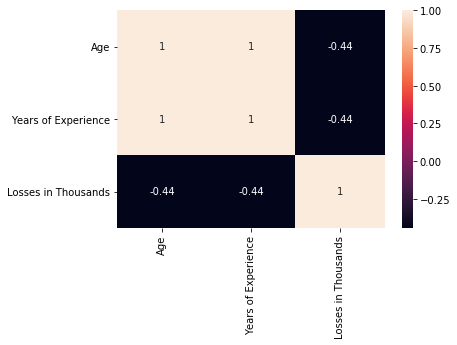

In [21]:
sns.heatmap(hcorr,annot=True)

<b>So what does the value of Correlation suggest?</b>
- If Spearmann correlation coefficient is greater than +0.5 or lesset than -0.5 its highly correlated

<b>Conclusion:</b>
   - Age and Years of experience have high correlation
   - Losses in Thousands have medium correlation with age and years of experience

# 5.2 Numeric and Categorical variables

# 5.2.1 Age and Number of vehicles

In [22]:
def boxplotAndCorrelation(numVariable,catVariable=banking['Number of Vehicles']):
    """Return boxplot between a categorical and numerical variable. Also calculates biserial correlation.
    numVariable = a numerical variable of interest."""
    
    # Calculate point biserial correlation and p value
    biserialCorr = stats.pointbiserialr(numVariable,catVariable)[0].round(2)
    pValue = stats.pointbiserialr(numVariable,catVariable)[1].round(5)
    
    # Create subplot object.
    fig = make_subplots(
        rows=1,
        cols=1,
        print_grid=False,
    )
    
    # This trace plots boxplot of categorical variable vs numerical variable
    fig.add_trace(
        go.Box(
            x = catVariable,
            y = numVariable,
            marker_color="lightseagreen",
            ))
    
    
    # Update layout
    fig.layout.update(
        height=500, 
        width=900,
        showlegend=False,
        title_text= f"Association between {catVariable.name} and {numVariable.name} (corr: {biserialCorr}, p: {pValue})",
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )
    
    # Update axes
    fig.layout.xaxis1.update(title=f"<b>{catVariable.name}</b>")
    fig.layout.yaxis1.update(title=f"<b>{numVariable.name}</b>")
    return fig.show()


"""#2.Create another function to calculate mean when grouped by categorical variable. And also plot the grouped mean."""
def numGroupedByCat(numVariable,catVariable=banking['Number of Vehicles']):
    """Returns a barplot showing mean of numerical variable across the class of categorical variable."""
    
    # Calculates mean across different classes of categorical variable
    numGroupedByCat = numVariable.groupby(catVariable).mean().round(2)
    
    # Create subplot object.
    fig = make_subplots(
        rows=1,
        cols=1,
        print_grid=False,
    )
    
    # This trace plots barplot
    fig.add_trace(
        go.Bar(
            x = numGroupedByCat.index,
            y = numGroupedByCat,
            text=numGroupedByCat,
            hoverinfo="x+y",
            textposition="auto",
            textfont=dict(family="sans serif",size=15)
        ))
    
    # Update layout
    fig.layout.update(
        height=500, 
        width=900,
        showlegend=False,
        title_text= f"Mean {numVariable.name} across {catVariable.name}",
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )
    
    # Update axes
    fig.layout.xaxis1.update(title=f"<b>{catVariable.name}</b>")
    fig.layout.yaxis1.update(title=f"<b>Mean {numVariable.name}</b>")
    return fig.show()

    
"""#3.This function plots histogram of numerical variable for every class of categorical variable."""
def numHistByCat(numVariable,catVariable=banking['Number of Vehicles']):
    """Returns numerical variable distribution across classes of categorical variable."""
    fig,ax = plt.subplots(1,1,figsize = (18,7))
    font_size = 15
    title_size = 18
    numVariable[catVariable==1].hist(bins=50,color="green", label = "Number of vehicles:1", grid = False, alpha=0.5)
    numVariable[catVariable==2].hist(bins=50,color="blue", label = "Number of vehicles:2", grid = False, alpha=0.5)
    numVariable[catVariable==3].hist(bins=50,color="red", label = "Number of vehicles:3", grid = False, alpha=0.5)
    numVariable[catVariable==4].hist(bins=50,color="yellow", label = "Number of vehicles:4", grid = False, alpha=0.5)
    ax.set_yticks([])
    ax.tick_params(axis="x", labelsize=font_size)
    ax.set_xlabel(f"{numVariable.name}", fontsize = font_size)
    ax.set_title(f"{numVariable.name} Distribution vs No.Of vehicles ", fontsize = title_size)
    plt.legend()
    return plt.show()

   
"""#4.Create a function to calculate anova between numerical and categorical variable."""
def calculateAnova(numVariable, catVariable=banking['Number of Vehicles']):
    """Returns f statistics and p value after anova calculation."""
    
    groupNumVariableByCatVariable1 = numVariable[catVariable==1] # Group our numerical variable by categorical variable(1). Group Fair by survivors
    groupNumVariableByCatVariable2 = numVariable[catVariable==2]
    groupNumVariableByCatVariable3 = numVariable[catVariable==3] # Group our numerical variable by categorical variable(1). Group Fair by survivors
    groupNumVariableByCatVariable4 = numVariable[catVariable==4] # Group our numerical variable by categorical variable(0). Group Fare by victims
    # Calculate one way anova
    fValue, pValue = stats.f_oneway(groupNumVariableByCatVariable1, groupNumVariableByCatVariable2,groupNumVariableByCatVariable3,groupNumVariableByCatVariable4) # Calculate f statistics and p value
    return f"Anova Result between {numVariable.name} & {catVariable.name}: f=> {fValue}, p=> {pValue}"



In [23]:
boxplotAndCorrelation(banking.Age)

In [24]:
numGroupedByCat(banking.Age)

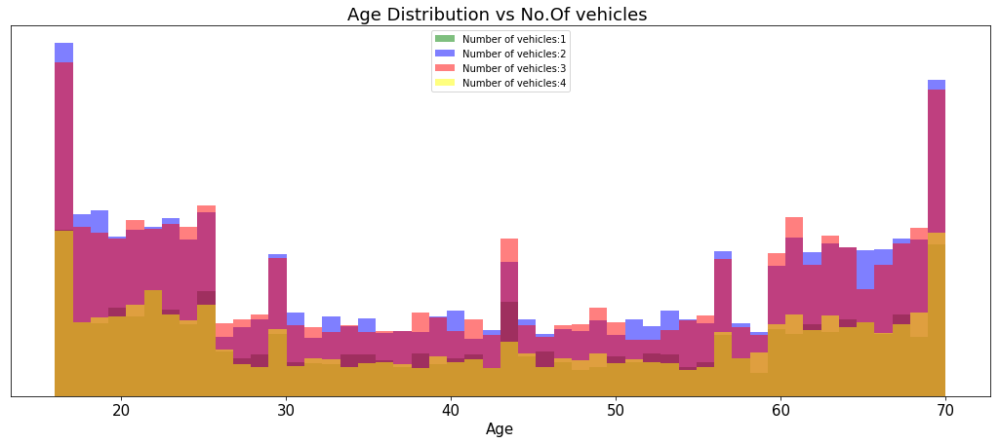

In [25]:
numHistByCat(banking.Age)

In [26]:
calculateAnova(banking.Age)

'Anova Result between Age & Number of Vehicles: f=> 0.5670698951938895, p=> 0.6366735607164662'

# 5.2.2 Number of years of experience and Number of vehicles

In [27]:
boxplotAndCorrelation(banking['Years of Experience'])

In [28]:
numGroupedByCat(banking['Years of Experience'])

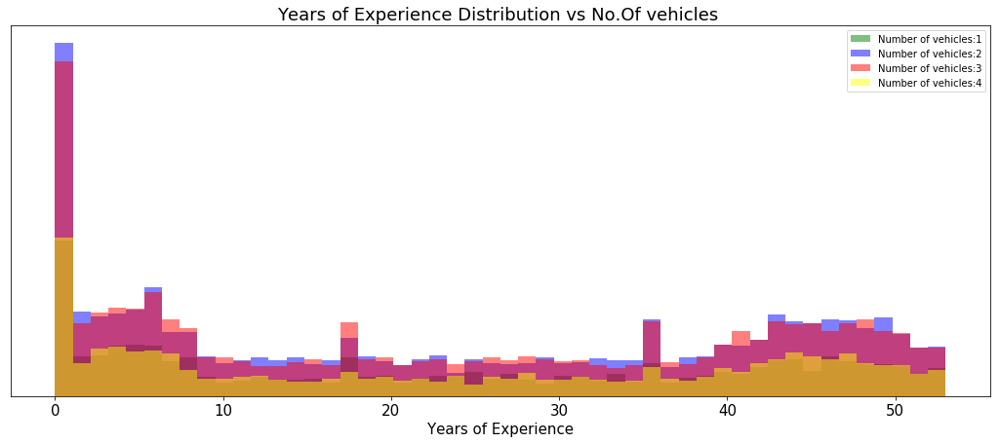

In [29]:
numHistByCat(banking['Years of Experience'])

In [30]:
calculateAnova(banking['Years of Experience'])

'Anova Result between Years of Experience & Number of Vehicles: f=> 0.5986653698995835, p=> 0.6158167990531687'

# 5.2.3 Loss in thousands and No.of vehicles

In [31]:
boxplotAndCorrelation(banking['Losses in Thousands'])

In [32]:
numGroupedByCat(banking['Losses in Thousands'])

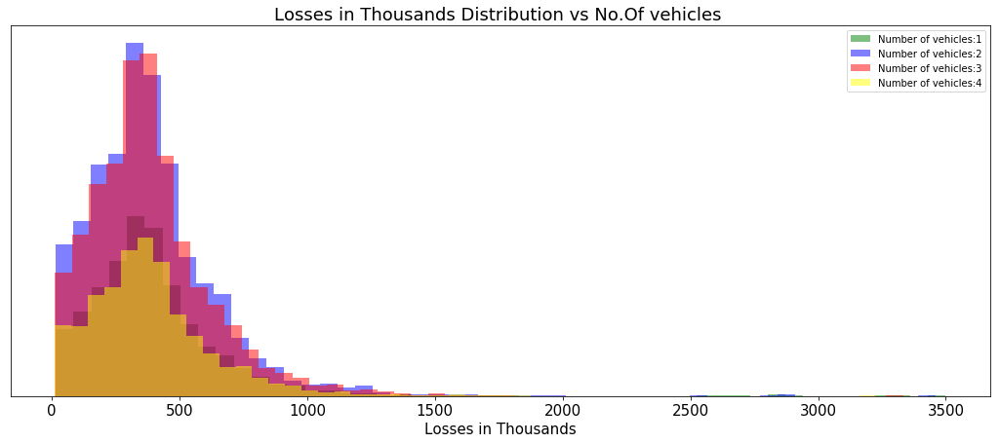

In [33]:
numHistByCat(banking['Losses in Thousands'])

In [34]:
calculateAnova(banking['Losses in Thousands'])

'Anova Result between Losses in Thousands & Number of Vehicles: f=> 0.993416839369863, p=> 0.39471014822201045'

<b>Conclusion:</b>
    - Age and Years of exp and Losses in Thousands are not correlated to number of vehicles

# One hot encoding 

In [35]:
banking=pd.get_dummies(data=banking, columns=['Married', 'Gender'],drop_first=True)

In [36]:
banking.head()

,Ac_No,Age,Years of Experience,Number of Vehicles,Losses in Thousands,Log Losses in Thousands,Married_Single,Gender_M
0,150024,24,5,1,203.319595,14.259018,0,1
1,144880,31,10,1,402.197302,20.054857,1,0
2,133742,56,37,1,553.132096,23.518761,0,1
3,151282,52,31,1,292.430579,17.100602,0,0
4,174407,20,3,1,246.540576,15.701611,1,1


In [37]:
banking.rename(columns = {'Married_Single':'Married', 'Gender_M':'Gender'}, inplace = True) 

In [38]:
banking.head()

,Ac_No,Age,Years of Experience,Number of Vehicles,Losses in Thousands,Log Losses in Thousands,Married,Gender
0,150024,24,5,1,203.319595,14.259018,0,1
1,144880,31,10,1,402.197302,20.054857,1,0
2,133742,56,37,1,553.132096,23.518761,0,1
3,151282,52,31,1,292.430579,17.100602,0,0
4,174407,20,3,1,246.540576,15.701611,1,1


In [39]:
def boxplotAndCorrelation(numVariable,catVariable=banking['Married']):
    """Return boxplot between a categorical and numerical variable. Also calculates biserial correlation.
    numVariable = a numerical variable of interest."""
    
    # Calculate point biserial correlation and p value
    biserialCorr = stats.pointbiserialr(numVariable,catVariable)[0].round(2)
    pValue = stats.pointbiserialr(numVariable,catVariable)[1].round(5)
    
    # Create subplot object.
    fig = make_subplots(
        rows=1,
        cols=1,
        print_grid=False,
    )
    
    # This trace plots boxplot of categorical variable vs numerical variable
    fig.add_trace(
        go.Box(
            x = catVariable,
            y = numVariable,
            marker_color="lightseagreen",
            ))
    
    
    # Update layout
    fig.layout.update(
        height=500, 
        width=900,
        showlegend=False,
        title_text= f"Association between {catVariable.name} and {numVariable.name} (corr: {biserialCorr}, p: {pValue})",
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )
    
    # Update axes
    fig.layout.xaxis1.update(title=f"<b>{catVariable.name}</b>")
    fig.layout.yaxis1.update(title=f"<b>{numVariable.name}</b>")
    return fig.show()


"""#2.Create another function to calculate mean when grouped by categorical variable. And also plot the grouped mean."""
def numGroupedByCat(numVariable,catVariable=banking['Married']):
    """Returns a barplot showing mean of numerical variable across the class of categorical variable."""
    
    # Calculates mean across different classes of categorical variable
    numGroupedByCat = numVariable.groupby(catVariable).mean().round(2)
    
    # Create subplot object.
    fig = make_subplots(
        rows=1,
        cols=1,
        print_grid=False,
    )
    
    # This trace plots barplot
    fig.add_trace(
        go.Bar(
            x = numGroupedByCat.index,
            y = numGroupedByCat,
            text=numGroupedByCat,
            hoverinfo="x+y",
            textposition="auto",
            textfont=dict(family="sans serif",size=15)
        ))
    
    # Update layout
    fig.layout.update(
        height=500, 
        width=900,
        showlegend=False,
        title_text= f"Mean {numVariable.name} across {catVariable.name}",
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )
    
    # Update axes
    fig.layout.xaxis1.update(title=f"<b>{catVariable.name}</b>")
    fig.layout.yaxis1.update(title=f"<b>Mean {numVariable.name}</b>")
    return fig.show()

    
"""#3.This function plots histogram of numerical variable for every class of categorical variable."""
def numHistByCat(numVariable,catVariable=banking['Married']):
    """Returns numerical variable distribution across classes of categorical variable."""
    fig,ax = plt.subplots(1,1,figsize = (18,7))
    font_size = 15
    title_size = 18
    numVariable[catVariable==0].hist(bins=50,color="green", label = "Married", grid = False, alpha=0.5)
    numVariable[catVariable==1].hist(bins=50,color="blue", label = "Single", grid = False, alpha=0.5)
    ax.set_yticks([])
    ax.tick_params(axis="x", labelsize=font_size)
    ax.set_xlabel(f"{numVariable.name}", fontsize = font_size)
    ax.set_title(f"{numVariable.name} Distribution vs Married", fontsize = title_size)
    plt.legend()
    return plt.show()

   
"""#4.Create a function to calculate anova between numerical and categorical variable."""
def calculateAnova(numVariable, catVariable=banking['Married']):
    """Returns f statistics and p value after anova calculation."""
    
    groupNumVariableByCatVariable0 = numVariable[catVariable==0] # Group our numerical variable by categorical variable(1). Group Fair by survivors
    groupNumVariableByCatVariable1 = numVariable[catVariable==1]
 # Group our numerical variable by categorical variable(0). Group Fare by victims
    # Calculate one way anova
    fValue, pValue = stats.f_oneway(groupNumVariableByCatVariable0, groupNumVariableByCatVariable1) # Calculate f statistics and p value
    return f"Anova Result between {numVariable.name} & {catVariable.name}: f=> {fValue}, p=> {pValue}"

# 5.2.4 Age and Married

In [40]:
boxplotAndCorrelation(banking.Age)

In [41]:
numGroupedByCat(banking.Age)

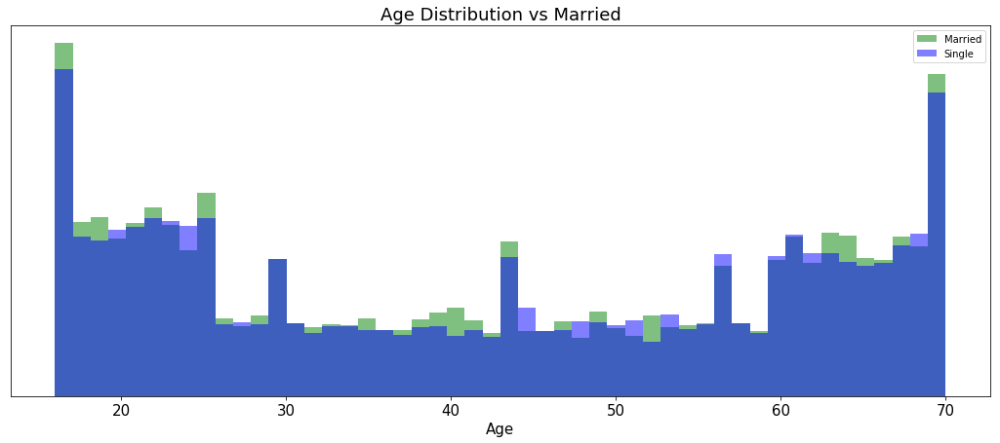

In [42]:
numHistByCat(banking.Age)

In [43]:
calculateAnova(banking.Age)

'Anova Result between Age & Married: f=> 0.2854840692424866, p=> 0.5931368553383377'

# 5.2.5 Years of experience and Married

In [44]:
boxplotAndCorrelation(banking['Years of Experience'])

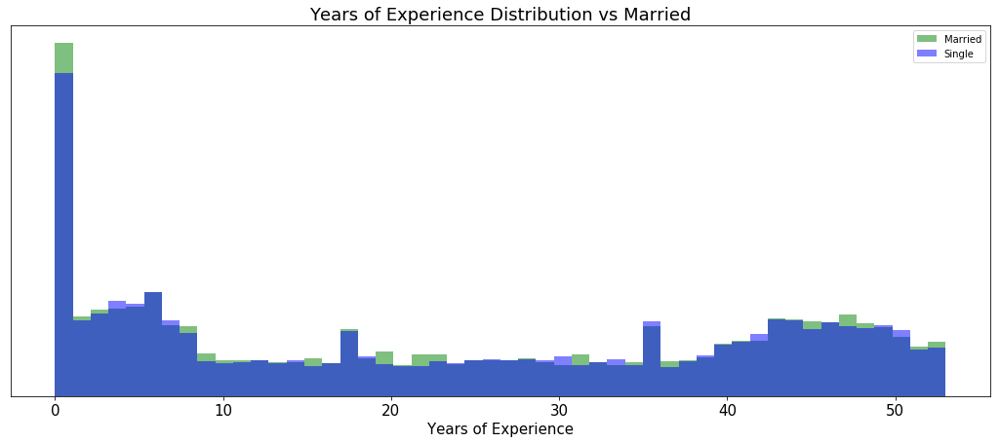

In [45]:
numHistByCat(banking['Years of Experience'])

In [46]:
calculateAnova(banking['Years of Experience'])

'Anova Result between Years of Experience & Married: f=> 0.38662599154605304, p=> 0.5340875491025174'

# 5.2.6 Loss in thousands and Married

In [47]:
boxplotAndCorrelation(banking['Losses in Thousands'])

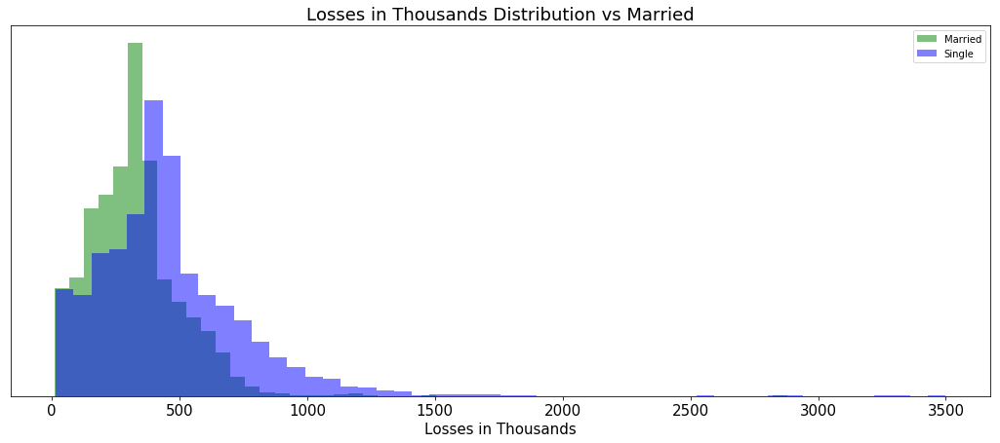

In [48]:
numHistByCat(banking['Losses in Thousands'])

In [49]:
calculateAnova(banking['Losses in Thousands'])

'Anova Result between Losses in Thousands & Married: f=> 1157.7862737467424, p=> 1.0976548997937116e-244'

<b>Conclusion:</b>
    - Years of exp and Age is not correlated with Married
    - Losses in Thousands is correlated with Married as p<=0.05

# 5.2.7 Age and Gender

In [50]:
def boxplotAndCorrelation(numVariable,catVariable=banking['Gender']):
    """Return boxplot between a categorical and numerical variable. Also calculates biserial correlation.
    numVariable = a numerical variable of interest."""
    
    # Calculate point biserial correlation and p value
    biserialCorr = stats.pointbiserialr(numVariable,catVariable)[0].round(2)
    pValue = stats.pointbiserialr(numVariable,catVariable)[1].round(5)
    
    # Create subplot object.
    fig = make_subplots(
        rows=1,
        cols=1,
        print_grid=False,
    )
    
    # This trace plots boxplot of categorical variable vs numerical variable
    fig.add_trace(
        go.Box(
            x = catVariable,
            y = numVariable,
            marker_color="lightseagreen",
            ))
    
    
    # Update layout
    fig.layout.update(
        height=500, 
        width=900,
        showlegend=False,
        title_text= f"Association between {catVariable.name} and {numVariable.name} (corr: {biserialCorr}, p: {pValue})",
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )
    
    # Update axes
    fig.layout.xaxis1.update(title=f"<b>{catVariable.name}</b>")
    fig.layout.yaxis1.update(title=f"<b>{numVariable.name}</b>")
    return fig.show()


"""#2.Create another function to calculate mean when grouped by categorical variable. And also plot the grouped mean."""
def numGroupedByCat(numVariable,catVariable=banking['Gender']):
    """Returns a barplot showing mean of numerical variable across the class of categorical variable."""
    
    # Calculates mean across different classes of categorical variable
    numGroupedByCat = numVariable.groupby(catVariable).mean().round(2)
    
    # Create subplot object.
    fig = make_subplots(
        rows=1,
        cols=1,
        print_grid=False,
    )
    
    # This trace plots barplot
    fig.add_trace(
        go.Bar(
            x = numGroupedByCat.index,
            y = numGroupedByCat,
            text=numGroupedByCat,
            hoverinfo="x+y",
            textposition="auto",
            textfont=dict(family="sans serif",size=15)
        ))
    
    # Update layout
    fig.layout.update(
        height=500, 
        width=900,
        showlegend=False,
        title_text= f"Mean {numVariable.name} across {catVariable.name}",
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )
    
    # Update axes
    fig.layout.xaxis1.update(title=f"<b>{catVariable.name}</b>")
    fig.layout.yaxis1.update(title=f"<b>Mean {numVariable.name}</b>")
    return fig.show()

    
"""#3.This function plots histogram of numerical variable for every class of categorical variable."""
def numHistByCat(numVariable,catVariable=banking['Gender']):
    """Returns numerical variable distribution across classes of categorical variable."""
    fig,ax = plt.subplots(1,1,figsize = (18,7))
    font_size = 15
    title_size = 18
    numVariable[catVariable==0].hist(bins=50,color="green", label = "Female", grid = False, alpha=0.5)
    numVariable[catVariable==1].hist(bins=50,color="blue", label = "Male", grid = False, alpha=0.5)
    ax.set_yticks([])
    ax.tick_params(axis="x", labelsize=font_size)
    ax.set_xlabel(f"{numVariable.name}", fontsize = font_size)
    ax.set_title(f"{numVariable.name} Distribution vs Gender", fontsize = title_size)
    plt.legend()
    return plt.show()

   
"""#4.Create a function to calculate anova between numerical and categorical variable."""
def calculateAnova(numVariable, catVariable=banking['Married']):
    """Returns f statistics and p value after anova calculation."""
    
    groupNumVariableByCatVariable0 = numVariable[catVariable==0] # Group our numerical variable by categorical variable(1). Group Fair by survivors
    groupNumVariableByCatVariable1 = numVariable[catVariable==1]
 # Group our numerical variable by categorical variable(0). Group Fare by victims
    # Calculate one way anova
    fValue, pValue = stats.f_oneway(groupNumVariableByCatVariable0, groupNumVariableByCatVariable1) # Calculate f statistics and p value
    return f"Anova Result between {numVariable.name} & {catVariable.name}: f=> {fValue}, p=> {pValue}"

In [51]:
boxplotAndCorrelation(banking.Age)

In [52]:
numGroupedByCat(banking.Age)

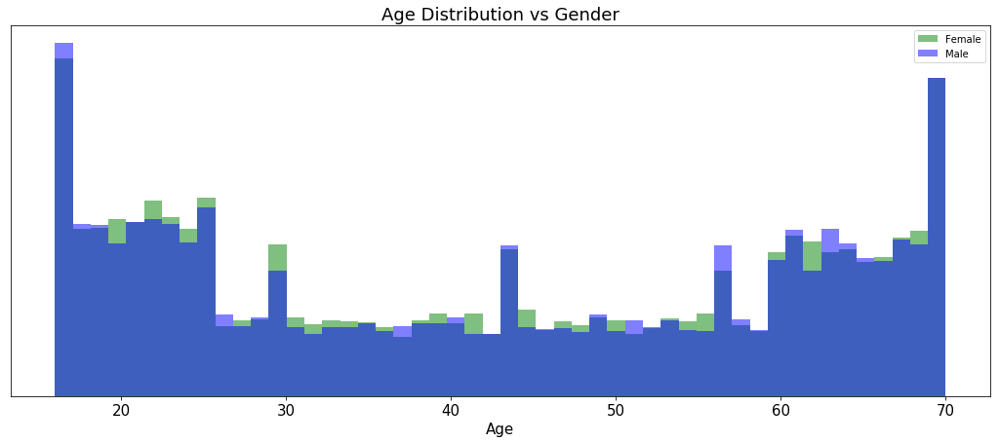

In [53]:
numHistByCat(banking.Age)

In [54]:
calculateAnova(banking.Age)

'Anova Result between Age & Married: f=> 0.2854840692424866, p=> 0.5931368553383377'

# 5.2.8 Years of exp and Gender

In [55]:
boxplotAndCorrelation(banking['Years of Experience'])

In [56]:
numGroupedByCat(banking['Years of Experience'])

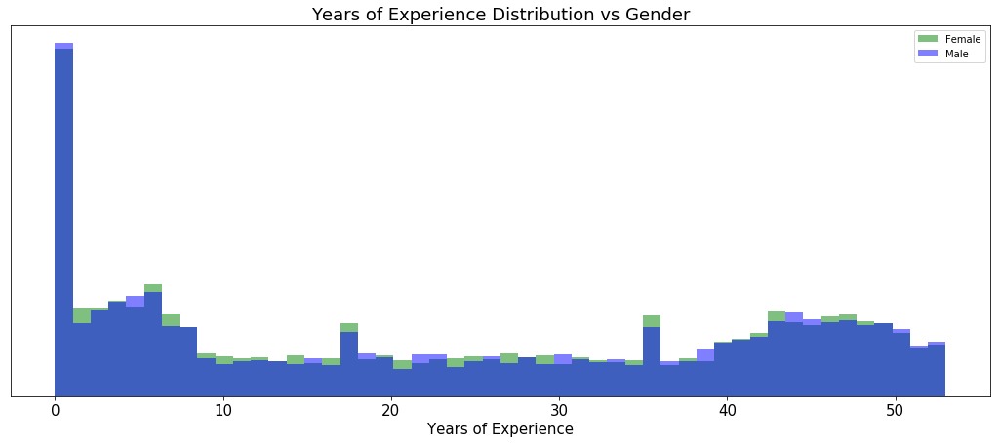

In [57]:
numHistByCat(banking['Years of Experience'])

In [58]:
calculateAnova(banking['Years of Experience'])

'Anova Result between Years of Experience & Married: f=> 0.38662599154605304, p=> 0.5340875491025174'

# 5.2.8  Loss and Gender

In [59]:
def boxplotAndCorrelation(numVariable,catVariable=banking['Gender']):
    """Return boxplot between a categorical and numerical variable. Also calculates biserial correlation.
    numVariable = a numerical variable of interest."""
    
    # Calculate point biserial correlation and p value
    biserialCorr = stats.pointbiserialr(numVariable,catVariable)[0].round(2)
    pValue = stats.pointbiserialr(numVariable,catVariable)[1].round(5)
    
    # Create subplot object.
    fig = make_subplots(
        rows=1,
        cols=1,
        print_grid=False,
    )
    
    # This trace plots boxplot of categorical variable vs numerical variable
    fig.add_trace(
        go.Box(
            x = catVariable,
            y = numVariable,
            marker_color="lightseagreen",
            ))
    
    
    # Update layout
    fig.layout.update(
        height=500, 
        width=900,
        showlegend=False,
        title_text= f"Association between {catVariable.name} and {numVariable.name} (corr: {biserialCorr}, p: {pValue})",
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )
    
    # Update axes
    fig.layout.xaxis1.update(title=f"<b>{catVariable.name}</b>")
    fig.layout.yaxis1.update(title=f"<b>{numVariable.name}</b>")
    return fig.show()


"""#2.Create another function to calculate mean when grouped by categorical variable. And also plot the grouped mean."""
def numGroupedByCat(numVariable,catVariable=banking['Gender']):
    """Returns a barplot showing mean of numerical variable across the class of categorical variable."""
    
    # Calculates mean across different classes of categorical variable
    numGroupedByCat = numVariable.groupby(catVariable).mean().round(2)
    
    # Create subplot object.
    fig = make_subplots(
        rows=1,
        cols=1,
        print_grid=False,
    )
    
    # This trace plots barplot
    fig.add_trace(
        go.Bar(
            x = numGroupedByCat.index,
            y = numGroupedByCat,
            text=numGroupedByCat,
            hoverinfo="x+y",
            textposition="auto",
            textfont=dict(family="sans serif",size=15)
        ))
    
    # Update layout
    fig.layout.update(
        height=500, 
        width=900,
        showlegend=False,
        title_text= f"Mean {numVariable.name} across {catVariable.name}",
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )
    
    # Update axes
    fig.layout.xaxis1.update(title=f"<b>{catVariable.name}</b>")
    fig.layout.yaxis1.update(title=f"<b>Mean {numVariable.name}</b>")
    return fig.show()

    
"""#3.This function plots histogram of numerical variable for every class of categorical variable."""
def numHistByCat(numVariable,catVariable=banking['Gender']):
    """Returns numerical variable distribution across classes of categorical variable."""
    fig,ax = plt.subplots(1,1,figsize = (18,7))
    font_size = 15
    title_size = 18
    numVariable[catVariable==0].hist(bins=50,color="green", label = "Female", grid = False, alpha=0.5)
    numVariable[catVariable==1].hist(bins=50,color="blue", label = "Male", grid = False, alpha=0.5)
    ax.set_yticks([])
    ax.tick_params(axis="x", labelsize=font_size)
    ax.set_xlabel(f"{numVariable.name}", fontsize = font_size)
    ax.set_title(f"{numVariable.name} Distribution vs Gender", fontsize = title_size)
    plt.legend()
    return plt.show()

   
"""#4.Create a function to calculate anova between numerical and categorical variable."""
def calculateAnova(numVariable, catVariable=banking['Married']):
    """Returns f statistics and p value after anova calculation."""
    
    groupNumVariableByCatVariable0 = numVariable[catVariable==0] # Group our numerical variable by categorical variable(1). Group Fair by survivors
    groupNumVariableByCatVariable1 = numVariable[catVariable==1]
 # Group our numerical variable by categorical variable(0). Group Fare by victims
    # Calculate one way anova
    fValue, pValue = stats.f_oneway(groupNumVariableByCatVariable0, groupNumVariableByCatVariable1) # Calculate f statistics and p value
    return f"Anova Result between {numVariable.name} & {catVariable.name}: f=> {fValue}, p=> {pValue}"

In [60]:
boxplotAndCorrelation(banking['Losses in Thousands'])

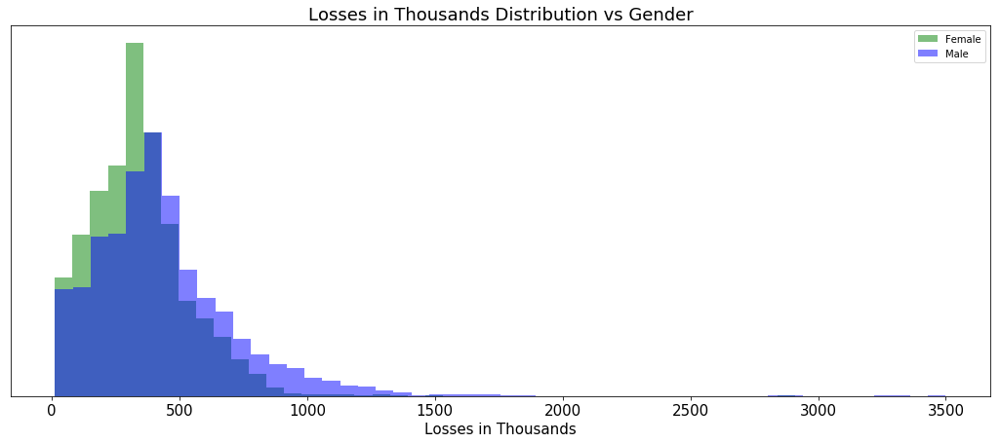

In [61]:
numHistByCat(banking['Losses in Thousands'])

In [62]:
calculateAnova(banking['Losses in Thousands'])

'Anova Result between Losses in Thousands & Married: f=> 1157.7862737467424, p=> 1.0976548997937116e-244'

<b>Conclusion:</b>
    - Age and Years of exp are not correlated to gender as p>0.05
    - Losses in thousands is  correlated to gender  as p<=0.05

# 5.3 Categorical and Categorical variables

<b>Chi-square Test:</b>
The Chi-square test of independence tests if there is a significant relationship between two categorical variables.The data is usually displayed in a cross-tabulation format with each row representing a category for one variable and each column representing a category for another variable. Chi-square test of independence is an omnibus test.That is it tests the data as a whole. This means that one will not be able to tell which levels (categories) of the variables are responsible for the relationship if the Chi-square table is larger than 2×2. If the test is larger than 2×2, it requires post hoc testing.

<b>The H0 (Null Hypothesis): </b>There is no relationship between variable 1 and variable 2.

<b>The H1 (Alternative Hypothesis):</b> There is a relationship between variable 1 and variable 2.

If the p-value is significant (less than 0.05), you can reject the null hypothesis and claim that the findings support the alternate hypothesis. While we check the results of the chi2 test, we need also to check that the expected cell frequencies are greater than or equal to 5. If a cell has an expected frequency less that 5, then the <b>Fisher’s Exact test </b> should be use to overcome this problem.

In [63]:
"""#1.Create a function that calculates absolute and relative frequency of Survived variable by a categorical variable. And then plots the absolute and relative frequency of Survived by a categorical variable."""
def calculateCrosstabulation(catVariable, targetCatVariable=banking['Number of Vehicles']):
    """ Plots cross tabulation in absolute and relative scale.
    catVariable = input categorical variable, 
    targetCatVariable = our target categorical variable."""
    
    # Calculate cross tabulation in abs and relative scale
    absCount = pd.crosstab(index = catVariable, columns = targetCatVariable)\
    .rename(columns={1:"No. of vehicles 1",2:"No.of vehicles 2",3:"No.of vehicles 3",4:"No.of vehicles 4"})
    relCount = pd.crosstab(index = catVariable, columns = targetCatVariable, normalize="index")\
    .rename(columns={1:"No. of vehicles 1",2:"No.of vehicles 2",3:"No.of vehicles 3",4:"No.of vehicles 4"})*100
    relCount = relCount.round(1)
    
    # Create two subplots of bar chart
    fig=make_subplots(
        rows=2, 
        cols=1,
        vertical_spacing=0.3,
        subplot_titles=(f"Absolute Count of No.of vehicles by {catVariable.name}", 
                        f"Percentage Count of No.of vehicles by {catVariable.name}"),
        print_grid=False) # This suppresses "This is the format of your plot grid:" text from popping out.

    # Add trace for absolute frequency
    for col in absCount.columns:
        fig.add_trace(go.Bar(x=absCount.index,
                             y=absCount[col],
                             text=absCount[col],
                             hoverinfo="x+y",
                             textposition="auto",
                             name=f"{col}",
                             textfont=dict(family="sans serif",size=14),
                             ),
                     row=1,
                     col=1
                     )


    # Add another trace for relative frequency
    for col in relCount.columns:
        fig.add_trace(go.Bar(x=relCount.index,
                             y=relCount[col],
                             text=relCount[col],
                             hoverinfo="x+y",
                             textposition="auto",
                             name=f"{col}",
                             textfont=dict(family="sans serif",size=14),
                            ),
                     row=2,
                     col=1
                     )
        
    # Update the layout. Add title, dimension, and background color
    fig.layout.update(
        height=600, 
        width=1000,
        hovermode="closest",
        barmode = "group",
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )

    # Set y-axes titles in bold
    fig.layout.yaxis1.update(title="<b>Abs Frequency</b>")
    fig.layout.yaxis2.update(title="<b>Rel Frequency(%)</b>")
    
    # Set x-axis title in bold
    fig.layout.xaxis2.update(title=f"<b>{catVariable.name}</b>")
    return fig.show()

    
"""#2.Create a function to calculate chi square test between a categorical and target categorical variable."""
def calculateChiSquare(catVariable, targetCatVariable=banking['Number of Vehicles']):
    """Returns chi square test restult between independent and dependent target variables."""
    
    catGroupedByCatTarget = pd.crosstab(index = catVariable, columns = targetCatVariable)
    testResult = stats.chi2_contingency(catGroupedByCatTarget)
    print(f"Chi Square Test Result between {targetCatVariable.name} & {catVariable.name}:")
    return print(testResult)


"""#3.Finally create another function to calculate Bonferroni-adjusted pvalue for a categorical and target categorical variable."""
def calculateBonferroniAdjusted(catVariable, targetCatVariable=banking['Number of Vehicles']):
    """Returns bonferroni-adjusted pvalue between independent and dependent target variables."""
    
    # Create one hot encoding for the independent categorical variable
    catEncoded = pd.get_dummies(catVariable)
    for column in catEncoded.columns:
        catGroupedByCatTarget = pd.crosstab(index = catEncoded[column], columns = targetCatVariable)
        testResult = stats.chi2_contingency(catGroupedByCatTarget)
        print(f"Bonferroni-adjusted pvalue between {catVariable.name}({column}) and {targetCatVariable.name}:")
        print(f"{testResult}\n")

In [64]:
calculateCrosstabulation(banking.Gender)

In [65]:
calculateChiSquare(banking.Gender)

Chi Square Test Result between Number of Vehicles & Gender:
(1.436433071918807, 0.6970172757234915, 3, array([[1283.39771092, 2610.36913015, 2581.48888162, 1271.74427731],
       [1249.60228908, 2541.63086985, 2513.51111838, 1238.25572269]]))


In [66]:
calculateBonferroniAdjusted(banking.Gender)

Bonferroni-adjusted pvalue between Gender(0) and Number of Vehicles:
(1.436433071918807, 0.6970172757234915, 3, array([[1249.60228908, 2541.63086985, 2513.51111838, 1238.25572269],
       [1283.39771092, 2610.36913015, 2581.48888162, 1271.74427731]]))

Bonferroni-adjusted pvalue between Gender(1) and Number of Vehicles:
(1.436433071918807, 0.6970172757234915, 3, array([[1283.39771092, 2610.36913015, 2581.48888162, 1271.74427731],
       [1249.60228908, 2541.63086985, 2513.51111838, 1238.25572269]]))



In [67]:
calculateCrosstabulation(banking['Married'])

In [68]:
calculateChiSquare(banking.Married)

Chi Square Test Result between Number of Vehicles & Married:
(3.2151621787351163, 0.35962609685388797, 3, array([[1289.36160889, 2622.49941138, 2593.48495749, 1277.65402224],
       [1243.63839111, 2529.50058862, 2501.51504251, 1232.34597776]]))


In [69]:
calculateBonferroniAdjusted(banking.Married)

Bonferroni-adjusted pvalue between Married(0) and Number of Vehicles:
(3.2151621787351163, 0.35962609685388797, 3, array([[1243.63839111, 2529.50058862, 2501.51504251, 1232.34597776],
       [1289.36160889, 2622.49941138, 2593.48495749, 1277.65402224]]))

Bonferroni-adjusted pvalue between Married(1) and Number of Vehicles:
(3.2151621787351163, 0.35962609685388797, 3, array([[1289.36160889, 2622.49941138, 2593.48495749, 1277.65402224],
       [1243.63839111, 2529.50058862, 2501.51504251, 1232.34597776]]))



In [70]:
def calculateCrosstabulation(catVariable, targetCatVariable=banking['Gender']):
    """ Plots cross tabulation in absolute and relative scale.
    catVariable = input categorical variable, 
    targetCatVariable = our target categorical variable."""
    
    # Calculate cross tabulation in abs and relative scale
    absCount = pd.crosstab(index = catVariable, columns = targetCatVariable)\
    .rename(columns={1:"No. of vehicles 1",2:"No.of vehicles 2",3:"No.of vehicles 3",4:"No.of vehicles 4"})
    relCount = pd.crosstab(index = catVariable, columns = targetCatVariable, normalize="index")\
    .rename(columns={1:"No. of vehicles 1",2:"No.of vehicles 2",3:"No.of vehicles 3",4:"No.of vehicles 4"})*100
    relCount = relCount.round(1)
    
    # Create two subplots of bar chart
    fig=make_subplots(
        rows=2, 
        cols=1,
        vertical_spacing=0.3,
        subplot_titles=(f"Absolute Count of Male and Female by {catVariable.name}", 
                        f"Percentage Count of Male and Female by {catVariable.name}"),
        print_grid=False) # This suppresses "This is the format of your plot grid:" text from popping out.

    # Add trace for absolute frequency
    for col in absCount.columns:
        fig.add_trace(go.Bar(x=absCount.index,
                             y=absCount[col],
                             text=absCount[col],
                             hoverinfo="x+y",
                             textposition="auto",
                             name=f"{col}",
                             textfont=dict(family="sans serif",size=14),
                             ),
                     row=1,
                     col=1
                     )


    # Add another trace for relative frequency
    for col in relCount.columns:
        fig.add_trace(go.Bar(x=relCount.index,
                             y=relCount[col],
                             text=relCount[col],
                             hoverinfo="x+y",
                             textposition="auto",
                             name=f"{col}",
                             textfont=dict(family="sans serif",size=14),
                            ),
                     row=2,
                     col=1
                     )
        
    # Update the layout. Add title, dimension, and background color
    fig.layout.update(
        height=600, 
        width=1000,
        hovermode="closest",
        barmode = "group",
        paper_bgcolor="rgb(243, 243, 243)",
        plot_bgcolor="rgb(243, 243, 243)"
        )

    # Set y-axes titles in bold
    fig.layout.yaxis1.update(title="<b>Abs Frequency</b>")
    fig.layout.yaxis2.update(title="<b>Rel Frequency(%)</b>")
    
    # Set x-axis title in bold
    fig.layout.xaxis2.update(title=f"<b>{catVariable.name}</b>")
    return fig.show()

    
"""#2.Create a function to calculate chi square test between a categorical and target categorical variable."""
def calculateChiSquare(catVariable, targetCatVariable=banking['Gender']):
    """Returns chi square test restult between independent and dependent target variables."""
    
    catGroupedByCatTarget = pd.crosstab(index = catVariable, columns = targetCatVariable)
    testResult = stats.chi2_contingency(catGroupedByCatTarget)
    print(f"Chi Square Test Result between {targetCatVariable.name} & {catVariable.name}:")
    return print(testResult)


"""#3.Finally create another function to calculate Bonferroni-adjusted pvalue for a categorical and target categorical variable."""
def calculateBonferroniAdjusted(catVariable, targetCatVariable=banking['Gender']):
    """Returns bonferroni-adjusted pvalue between independent and dependent target variables."""
    
    # Create one hot encoding for the independent categorical variable
    catEncoded = pd.get_dummies(catVariable)
    for column in catEncoded.columns:
        catGroupedByCatTarget = pd.crosstab(index = catEncoded[column], columns = targetCatVariable)
        testResult = stats.chi2_contingency(catGroupedByCatTarget)
        print(f"Bonferroni-adjusted pvalue between {catVariable.name}({column}) and {targetCatVariable.name}:")
        print(f"{testResult}\n")

In [71]:
calculateCrosstabulation(banking['Married'])

In [72]:
calculateChiSquare(banking.Married)

Chi Square Test Result between Gender & Married:
(0.9472609520907108, 0.3304174796955742, 1, array([[3943.4206017, 3839.5793983],
       [3803.5793983, 3703.4206017]]))


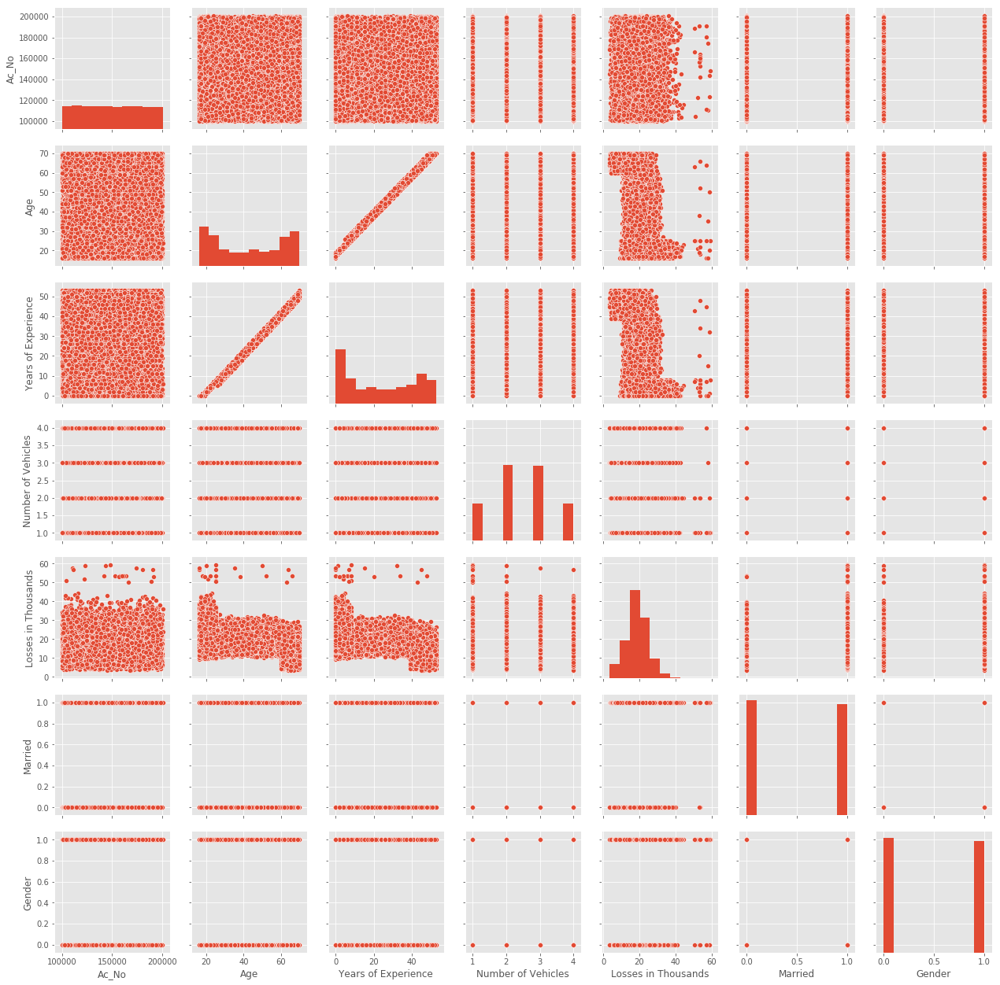

In [499]:
sns.pairplot(banking)

In [73]:
ageGroups = ["infant","child","teenager","youngAdult","adult","aged"]


groupRanges = [0,5,12,18,35,60,81]

banking["ageBinned"] = pd.cut(banking.Age, groupRanges, labels = ageGroups)

In [74]:
banking.ageBinned.value_counts()

youngAdult    5109
adult         4854
aged          3976
teenager      1351
child            0
infant           0
Name: ageBinned, dtype: int64

In [75]:
banking['Years of Experience'].describe()

count    15290.000000
mean        23.732897
std         17.850707
min          0.000000
25%          6.000000
50%         23.000000
75%         42.000000
max         53.000000
Name: Years of Experience, dtype: float64

In [273]:
ExperienceGroups = ["Trainee","ASE","SE","LSE","PSE","Director","VP","Head","Chairman"]


groupRanges = [-1,3,6,10,16,24,34,44,50,60]

banking["ExperienceBinned"] = pd.cut(banking['Years of Experience'], groupRanges, labels = ExperienceGroups)

In [398]:
banking.head()

,Ac_No,Age,Years of Experience,Number of Vehicles,Losses in Thousands,Married,Gender,ageBinned
0,150024,24,5,1,14.259018,0,1,youngAdult
1,144880,31,10,1,20.054857,1,0,youngAdult
2,133742,56,37,1,23.518761,0,1,adult
3,151282,52,31,1,17.100602,0,0,adult
4,174407,20,3,1,15.701611,1,1,youngAdult


In [195]:
#banking['ageBinned']=banking['ageBinned'].map({"infant":1,"child":2,"teenager":3,"youngAdult":4,"adult":5,"aged":6})

In [503]:
banking=pd.get_dummies(data=banking,columns=['ageBinned'],drop_first=True)

In [504]:
#banking['ExperienceBinned']=banking['ExperienceBinned'].map({"Trainee":1,"ASE":2,"SE":3,"LSE":4,"PSE":5,"Director":6,"VP":7,"Head":8,"Chairman":9})

In [76]:
x=banking.loc[:,['Gender','Married','Age']]
#x=pd.concat([x,banking.iloc[:,7:]],axis=1)
y=banking.loc[:,'Log Losses in Thousands']
x['Age'] = (x['Age']-x['Age'].mean())/x['Age'].std()
#x['Years of Experience'] = (x['Years of Experience']-x['Years of Experience'].mean())/x['Years of Experience'].std()
#y=y-y.mean()/y.std()

In [77]:
y.head()

0    14.259018
1    20.054857
2    23.518761
3    17.100602
4    15.701611
Name: Log Losses in Thousands, dtype: float64

In [78]:
banking.head()

,Ac_No,Age,Years of Experience,Number of Vehicles,Losses in Thousands,Log Losses in Thousands,Married,Gender,ageBinned
0,150024,24,5,1,203.319595,14.259018,0,1,youngAdult
1,144880,31,10,1,402.197302,20.054857,1,0,youngAdult
2,133742,56,37,1,553.132096,23.518761,0,1,adult
3,151282,52,31,1,292.430579,17.100602,0,0,adult
4,174407,20,3,1,246.540576,15.701611,1,1,youngAdult


In [79]:
banking.shape

(15290, 9)

# 6.Train Test split

In [80]:
##Split the dataset

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=10)
print ("Training shape:",x_train.shape)
print ("Testing shape:",x_test.shape)
print("Training shape:",y_train.shape)
print("Testing shape:",y_test.shape)

Training shape: (10703, 3)
Testing shape: (4587, 3)
Training shape: (10703,)
Testing shape: (4587,)


In [81]:
x_train.head()

,Gender,Married,Age
9563,0,1,-0.455581
6718,1,1,-1.002612
14014,1,0,1.349620
6772,0,1,-1.057315
2767,0,0,-1.112018


# 7.Linear Regression

# 7.1 Model Fit

In [82]:
linear_reg = LinearRegression()
model = linear_reg.fit(x_train,y_train) 

# 7.2 Slope & Intercept

In [83]:
# slope
print("Slope:")
print(model.coef_)
# slope
print("Intercept:")
print(model.intercept_)

Slope:
[ 2.07276915  3.15414842 -3.05827647]
Intercept:
16.211144527258966


# 7.3 Prediction

In [84]:
pred = model.predict(x_test)
print("Predicted medv for test:")
pred

Predicted medv for test:


array([21.09317983, 17.50234409, 14.65829342, ..., 16.97595636,
       21.68477154, 19.1101111 ])

# 7.4 Metrices

  - RMSE
  - MAE
  - R^2
  - Adjusted R^2

In [85]:
##Model evaluation
from sklearn import metrics
##RMSE ,MAE
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,pred)))
print("MAE:",metrics.mean_absolute_error(y_test,pred))

RMSE: 4.828473536809484
MAE: 3.770807541160741


In [86]:
r_squared=linear_reg.score(x_test,y_test)
adjusted_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-x_train.shape[1]-1)
print("Testing score")
print(r_squared,adjusted_r_squared)
r_squared=linear_reg.score(x_train,y_train)
print("Training score")
adjusted_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-x_train.shape[1]-1)
print(r_squared,adjusted_r_squared)

Testing score
0.35148404250661924 0.35130219860789225
Training score
0.34139124451376046 0.341206570594099


# 7.5 K-Fold cross validation

In [87]:
from sklearn.model_selection import KFold # import KFold
from sklearn.model_selection import cross_val_score
kf = KFold(10, True,10)

scores = cross_val_score(model, x_train, y_train,scoring=('r2'), cv=5)
err_scores = cross_val_score(model, x_train, y_train,scoring=('neg_mean_squared_error'), cv=10)
print("R2 score:")
print (scores)
print("MAE score:")
print (err_scores)
print("R2 std deviation:",scores.std())
print("R2  mean :",scores.mean())
print("MAE std deviation:",err_scores.std())
print("MAE mean:",err_scores.mean())

R2 score:
[0.34420597 0.35637084 0.33287586 0.33106803 0.33813703]
MAE score:
[-22.09049843 -26.12347482 -23.58656597 -23.60374462 -23.43930707
 -25.22331903 -28.48556466 -25.28324545 -24.25016232 -24.28172182]
R2 std deviation: 0.00914642879498016
R2  mean : 0.34053154462869484
MAE std deviation: 1.6777512581754814
MAE mean: -24.636760420145787


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:71: FutureWarning:

Pass shuffle=True, random_state=10 as keyword args. From version 0.25 passing these as positional arguments will result in an error



# 7.6 Ridge Regression

- Avoid multicolinearity 
- Shrink coefficent close to zero


In [88]:
cross_val_scores_ridge=[]
alpha=[]
print("RMSE scores:")
for i in range(1, 9): 
    ridgeModel = Ridge(alpha = i * 0.25) 
    ridgeModel.fit(x_train, y_train) 
    scores = cross_val_score(ridgeModel, x, y, cv = 10) 
   
    avg_cross_val_score = scores.mean()
    cross_val_scores_ridge.append(avg_cross_val_score) 
    alpha.append(i * 0.25) 
for i in range(0, len(alpha)): 
    print(str(alpha[i])+' : '+str(cross_val_scores_ridge[i]))

RMSE scores:
0.25 : 0.3439902641977392
0.5 : 0.34399033587391226
0.75 : 0.3439904063629049
1.0 : 0.34399047566517577
1.25 : 0.3439905437811832
1.5 : 0.34399061071138554
1.75 : 0.34399067645624076
2.0 : 0.34399074101620675


In [89]:
# Ridge regression
#Avoid multicolinearity and shrink coefficent
##Higher the alpha higher the reduction in rmse and better r^2
##Run only with all columns
ridgeR = Ridge(alpha = 0.25) 
model=ridgeR.fit(x_train, y_train) 
y_pred = model.predict(x_test) 

scores = cross_val_score(model, x_train, y_train,scoring=('r2'), cv=10)
print("R2 score:",scores.mean())
# calculate mean square error 
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,pred)))
  
# get ridge coefficient and print them 
ridge_coefficient = pd.DataFrame() 
ridge_coefficient["Columns"]= x_train.columns 
ridge_coefficient['Coefficient Estimate'] = pd.Series(ridgeR.coef_) 
print(ridge_coefficient) 

R2 score: 0.34029219966145663
RMSE: 4.828473536809484
   Columns  Coefficient Estimate
0   Gender              2.072575
1  Married              3.153853
2      Age             -3.058202


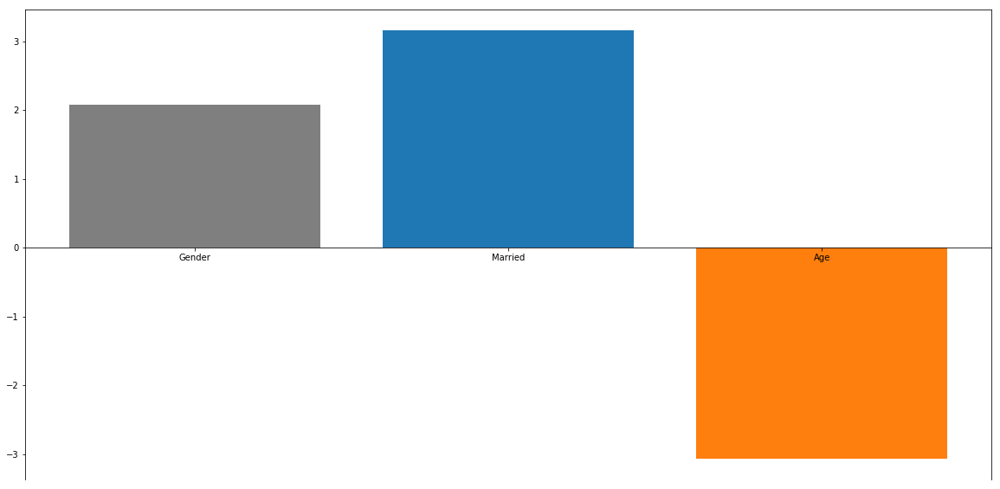

In [90]:
fig, ax = plt.subplots(figsize =(20, 10)) 
  
color =['tab:gray', 'tab:blue', 'tab:orange',  
'tab:green', 'tab:red', 'tab:purple', 'tab:brown',  
'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan',  
'tab:orange', 'tab:green', 'tab:blue', 'tab:olive'] 
  
ax.bar(ridge_coefficient["Columns"],  
ridge_coefficient['Coefficient Estimate'],  
color = color) 
  
ax.spines['bottom'].set_position('zero') 
  
plt.style.use('ggplot') 
plt.show() 

# 7.7 Lasso Regression

- Feature Selection
- Makes Coefficient to zero
- Wont consider Multicollinearity

In [91]:
cross_val_scores_lasso = [] 
  
# List to maintain the different values of Lambda 
Lambda = [] 
  
# Loop to compute the cross-validation scores 
for i in range(1, 9): 
    lassoModel = Lasso(alpha = i * 0.25, tol = 0.0925) 
    lassoModel.fit(x_train, y_train) 
    scores = cross_val_score(lassoModel, x, y, cv = 10) 
    avg_cross_val_score = scores.mean()*100
    cross_val_scores_lasso.append(avg_cross_val_score) 
    Lambda.append(i * 0.25) 
  
# Loop to print the different values of cross-validation scores 
for i in range(0, len(alpha)): 
    print(str(alpha[i])+' : '+str(cross_val_scores_lasso[i])) 

0.25 : 32.90045077138241
0.5 : 28.34831923158438
0.75 : 23.784257392722385
1.0 : 22.1149093505033
1.25 : 20.58757460781917
1.5 : 18.71977078703005
1.75 : 16.51149788813592
2.0 : 13.962755911136803


In [92]:
lasso = Lasso(alpha = 0.25) 
model=lasso.fit(x_train, y_train) 
y_pred1 = lasso.predict(x_test) 
  
scores = cross_val_score(model, x_train, y_train,scoring=('r2'), cv=10)
print("R2 score:",scores.mean())
# Calculate Mean Squared Error 
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,pred)))

lasso_coeff = pd.DataFrame() 
lasso_coeff["Columns"] = x_train.columns 
lasso_coeff['Coefficient Estimate'] = pd.Series(lasso.coef_) 
  
print(lasso_coeff) 

R2 score: 0.32521532583532176
RMSE: 4.828473536809484
   Columns  Coefficient Estimate
0   Gender              1.071015
1  Married              2.155341
2      Age             -2.795788


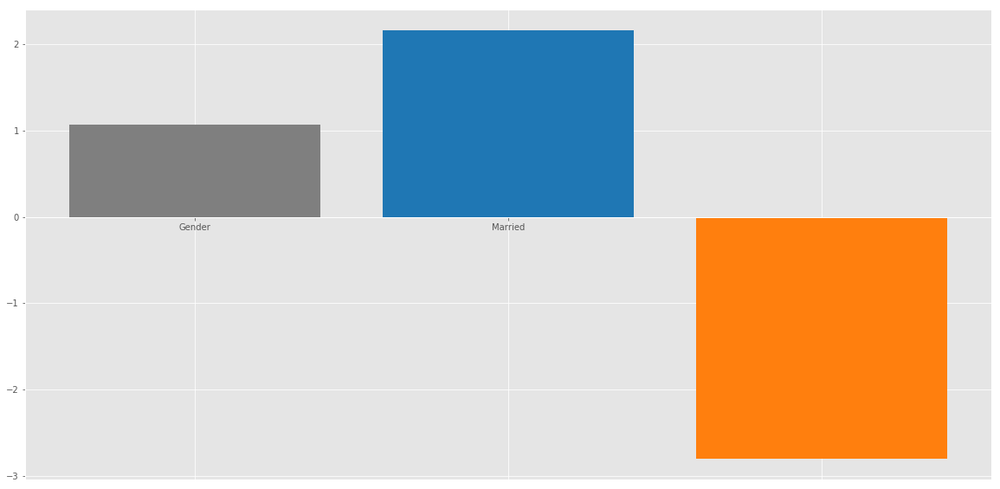

In [93]:
fig, ax = plt.subplots(figsize =(20, 10)) 
  
color =['tab:gray', 'tab:blue', 'tab:orange',  
'tab:green', 'tab:red', 'tab:purple', 'tab:brown',  
'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan',  
'tab:orange', 'tab:green', 'tab:blue', 'tab:olive'] 
  
ax.bar(lasso_coeff["Columns"],  
lasso_coeff['Coefficient Estimate'],  
color = color) 
  
ax.spines['bottom'].set_position('zero') 
  
plt.style.use('ggplot') 
plt.show() 

# 7.8 ElasticNet Regression

In [94]:
e_net = ElasticNet(alpha = 0.25) 
model=e_net.fit(x_train, y_train) 
  
# calculate the prediction and mean square error 
scores = cross_val_score(model, x_train, y_train,scoring=('r2'), cv=10)
print("R2 score:",scores.mean())
y_pred_elastic = model.predict(x_test) 
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,pred))) 
  
e_net_coeff = pd.DataFrame() 
e_net_coeff["Columns"] = x_train.columns 
e_net_coeff['Coefficient Estimate'] = pd.Series(e_net.coef_) 
e_net_coeff

R2 score: 0.3150281513271644
RMSE: 4.828473536809484


,Columns,Coefficient Estimate
0,Gender,1.044997
1,Married,1.767406
2,Age,-2.594666


# 8. Recursive Feature Elimination

In [95]:
##RFE
from sklearn.feature_selection import RFE, f_regression
fselect = RFE(model, n_features_to_select=3, verbose=3)
features = fselect.fit(x_train,y_train)
#features = fselect.fit(x,y)
print("Num Features: %s" % (features.n_features_))

#ref.support_ returns an array with boolean values to indicate whether an attribute was selected using RFE 
print("Selected Features: %s" % (features.support_))
# ref.ranking_ returns an array with positive integer values to indicate the attribute ranking with
# a lower score indicating a higher ranking 
print("Feature Ranking: %s" % (features.ranking_))
#print (features.get_params)

Num Features: 3
Selected Features: [ True  True  True]
Feature Ranking: [1 1 1]


# 9.Import statsmodel packages 

In [96]:
import statsmodels.formula.api as smf
import scipy.stats as scipystats
import statsmodels.api as sm
import statsmodels.stats.stattools as stools
import statsmodels.stats as stats 
from statsmodels.graphics.gofplots import ProbPlot
from statsmodels.graphics.regressionplots import *
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model
import copy
from sklearn.model_selection import train_test_split
import math
import time
from scipy import stats
import statsmodels.stats.api as sms
import statsmodels.stats.stattools as stools
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [97]:
banking2=pd.DataFrame()
for col in banking.columns:
    col2=col
    col2=col2.replace(' ','')
    banking2[col2]=banking[col]
    #print(col2,col)
banking2.head(10)

,Ac_No,Age,YearsofExperience,NumberofVehicles,LossesinThousands,LogLossesinThousands,Married,Gender,ageBinned
0,150024,24,5,1,203.319595,14.259018,0,1,youngAdult
1,144880,31,10,1,402.197302,20.054857,1,0,youngAdult
2,133742,56,37,1,553.132096,23.518761,0,1,adult
3,151282,52,31,1,292.430579,17.100602,0,0,adult
4,174407,20,3,1,246.540576,15.701611,1,1,youngAdult
5,142548,29,8,1,384.676395,19.613169,0,1,youngAdult
6,183396,36,19,1,462.158856,21.497880,1,0,adult
7,106838,67,49,1,168.934036,12.997463,0,0,aged
8,137434,69,48,1,69.893041,8.360206,1,1,aged
9,192628,16,0,1,242.772576,15.581161,1,0,teenager


# 9.1 OLS Model Fit

In [98]:
lm = smf.ols(formula = "(LossesinThousands)~Married+Gender+Age", data = banking2).fit()
y, X = dmatrices("(LossesinThousands)~Married+Gender+Age", data = banking2, return_type = "dataframe")

In [99]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      LossesinThousands   R-squared:                       0.302
Model:                            OLS   Adj. R-squared:                  0.302
Method:                 Least Squares   F-statistic:                     2202.
Date:                Sun, 26 Jul 2020   Prob (F-statistic):               0.00
Time:                        10:51:58   Log-Likelihood:            -1.0360e+05
No. Observations:               15290   AIC:                         2.072e+05
Df Residuals:                   15286   BIC:                         2.072e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    538.9167      4.923    109.473      0.000     529.267     548.566
Married      134.8882      3.430     39.321      0.000     128.164     141.612
Gender        93.6893      3.430     27.313      0.000      86.966     100.413
Age           -6.1780      0.094    -65.854      0.000      -6.362      -5.994
==============================================================================
Omnibus:                    11171.709   Durbin-Watson:                   1.806
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           544287.151
Skew:                           3.004   Prob(JB):                         0.00
Kurtosis:                      31.605   Cond. No.                         143.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# 9.2 Linear Model Assumptions

 - Residuals should be homoscadstic in nature
 - vif should not be greater than 5
 - Residuals should be normally distributed
 - Residuals should not be autocorrelated

# 9.2.1 HomoScadsticity Validation

In [100]:
print ("Durbin-Watson test statistics is " + str(stools.durbin_watson(lm.resid)))

name = ['Lagrange multiplier statistic', 'p-value', 
        'f-value', 'f p-value']
test = sms.het_breuschpagan(lm.resid, lm.model.exog)
test

Durbin-Watson test statistics is 1.8063381387171196


(168.14058505248298,
 3.206804395844072e-36,
 56.655223686131535,
 2.0576760552220735e-36)

# 9.2.2 Vif Validation

In [101]:
vif = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print (vif)
#crim+ zn+ indus+ chas+ nox+ rm+ age+ dis+rad+tax+ptratio+black+lstat
print(X.columns)

[8.24102454375818, 1.0000823391547828, 1.0000927805303526, 1.000047419122874]
Index(['Intercept', 'Married', 'Gender', 'Age'], dtype='object')


# 9.3 Normality of Residual

Text(0.5,0,'Normalized residuals')

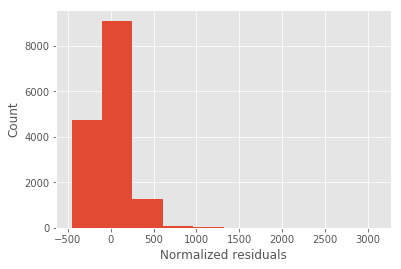

In [102]:
##Normality of residual
plt.hist(lm.resid)
plt.ylabel('Count')
plt.xlabel('Normalized residuals')

# 10. Cooks distance 

- It is used to remove outliers based on leverages and residuals which are higher in nature

<StemContainer object of 3 artists>

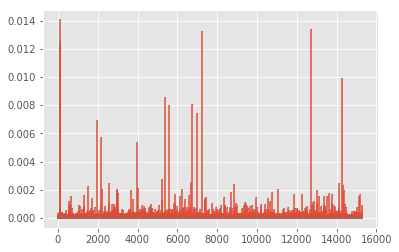

In [103]:
influence = lm.get_influence()
#c is the distance and p is p-value
(c, p) = influence.cooks_distance
#print(np.where(c>4/len(c)))
#c=(c[c>0.1])
plt.stem(np.arange(len(c)), c, markerfmt=",")

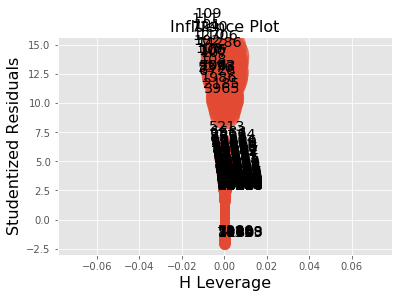

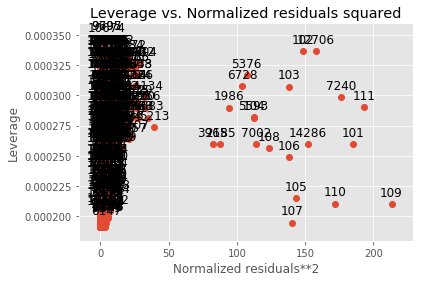

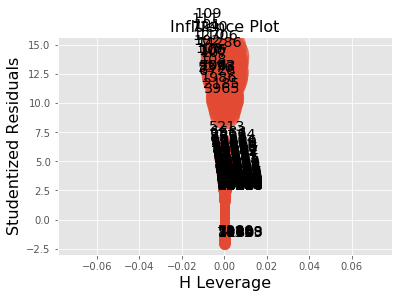

In [104]:
from statsmodels.graphics.regressionplots import *
plot_leverage_resid2(lm)
influence_plot(lm,criterion="cooks")

In [105]:
# model values
model_fitted_y = lm.fittedvalues
#print(model_fitted_y)
# model residuals
model_residuals = lm.resid
# normalized residuals
model_norm_residuals = lm.get_influence().resid_studentized_internal
# absolute squared normalized residuals
model_norm_residuals_abs_sqrt = np.sqrt(np.abs(model_norm_residuals))
# absolute residuals
model_abs_resid = np.abs(model_residuals)
# leverage, from statsmodels internals
model_leverage = lm.get_influence().hat_matrix_diag
# cook's distance, from statsmodels internals
model_cooks = lm.get_influence().cooks_distance[0]

# 11. Linear Model Assumption Plots

# 11.1 Residual vs Fitted 

TypeError: can't multiply sequence by non-int of type 'float'

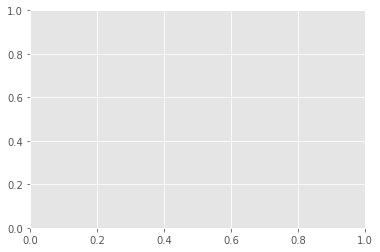

In [106]:
plot_lm_1 = plt.figure()
plot_lm_1.axes[0] = sns.residplot(model_fitted_y, banking.columns[-1], data=banking,
                          lowess=True,
                          scatter_kws={'alpha': 0.5},
                          line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8})

plot_lm_1.axes[0].set_title('Residuals vs Fitted')
plot_lm_1.axes[0].set_xlabel('Fitted values')
plot_lm_1.axes[0].set_ylabel('Residuals');

# 11.2 QQ Plot

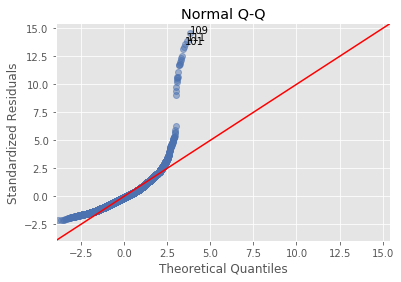

In [107]:
QQ = ProbPlot(model_norm_residuals)
plot_lm_2 = QQ.qqplot(line='45', alpha=0.5, color='#4C72B0', lw=1)
plot_lm_2.axes[0].set_title('Normal Q-Q')
plot_lm_2.axes[0].set_xlabel('Theoretical Quantiles')
plot_lm_2.axes[0].set_ylabel('Standardized Residuals');
# annotations
abs_norm_resid = np.flip(np.argsort(np.abs(model_norm_residuals)), 0)
abs_norm_resid_top_3 = abs_norm_resid[:3]
for r, i in enumerate(abs_norm_resid_top_3):
    plot_lm_2.axes[0].annotate(i,
                               xy=(np.flip(QQ.theoretical_quantiles, 0)[r],
                                   model_norm_residuals[i]));

# 11.3 Homoscadstic plot

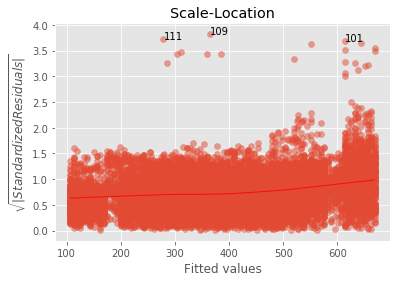

In [108]:
##Check for homoscadticity
plot_lm_3 = plt.figure()
plt.scatter(model_fitted_y, model_norm_residuals_abs_sqrt, alpha=0.5);
sns.regplot(model_fitted_y, model_norm_residuals_abs_sqrt,
              scatter=False,
              ci=False,
              lowess=True,
              line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8});
plot_lm_3.axes[0].set_title('Scale-Location')
plot_lm_3.axes[0].set_xlabel('Fitted values')
plot_lm_3.axes[0].set_ylabel('$\sqrt{|Standardized Residuals|}$');

  # annotations
abs_sq_norm_resid = np.flip(np.argsort(model_norm_residuals_abs_sqrt), 0)
abs_sq_norm_resid_top_3 = abs_sq_norm_resid[:3]
for i in abs_norm_resid_top_3:
      plot_lm_3.axes[0].annotate(i,xy=(model_fitted_y[i],model_norm_residuals_abs_sqrt[i]))

# 11.4 Residual vs Leverage Plot

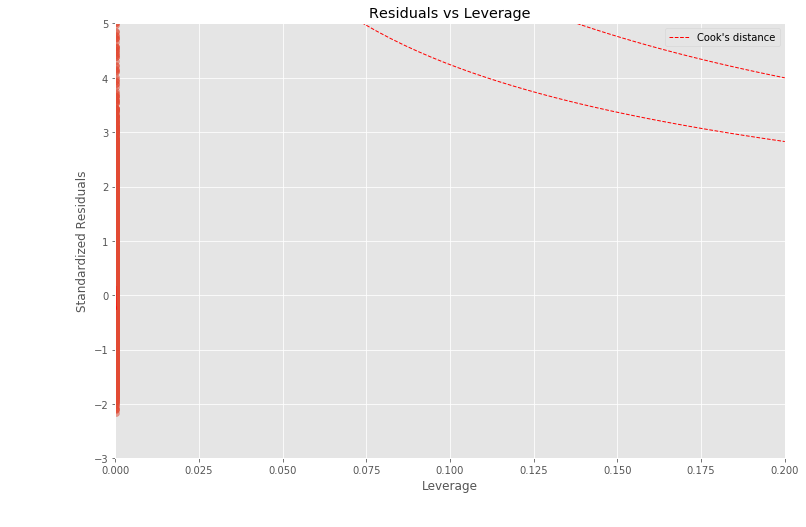

In [109]:
##Influence points by cooks distance
plot_lm_4 = plt.figure(4)
plot_lm_4.set_figheight(8)
plot_lm_4.set_figwidth(12)

plt.scatter(model_leverage, model_norm_residuals, alpha=0.5)
sns.regplot(model_leverage, model_norm_residuals, 
            scatter=False, 
            ci=False, 
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8})

plot_lm_4.axes[0].set_xlim(0, 0.20)
plot_lm_4.axes[0].set_ylim(-3, 5)
plot_lm_4.axes[0].set_title('Residuals vs Leverage')
plot_lm_4.axes[0].set_xlabel('Leverage')
plot_lm_4.axes[0].set_ylabel('Standardized Residuals')

# annotations
leverage_top_3 = np.flip(np.argsort(model_cooks), 0)[:3]

for i in leverage_top_3:
    plot_lm_4.axes[0].annotate(i, 
                               xy=(model_leverage[i], 
                                   model_norm_residuals[i]))
    
# shenanigans for cook's distance contours
def graph(formula, x_range, label=None):
    x = x_range
    y = formula(x)
    plt.plot(x, y, label=label, lw=1, ls='--', color='red')

p = len(lm.params) # number of model parameters

graph(lambda x: np.sqrt((0.5 * p * (1 - x)) / x), 
      np.linspace(0.001, 0.200, 50), 
      'Cook\'s distance') # 0.5 line
graph(lambda x: np.sqrt((1 * p * (1 - x)) / x), 
      np.linspace(0.001, 0.200, 50)) # 1 line
plt.legend(loc='upper right');

# 12. DecisionTree Regressor

In [110]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import export_graphviz,export_text
import graphviz 
from sklearn import tree

In [707]:
dt_grid = {'max_leaf_nodes': np.arange(1, 10), 'min_samples_split': np.arange(1, 100),
          'max_depth' : np.arange(1, 10),'criterion':['mse','friedman_mse','mae']}

In [708]:
dbr = GridSearchCV(DecisionTreeRegressor(), param_grid = dt_grid , cv = 3, verbose=True, n_jobs=-1)
dbr = dbr.fit(x_train,y_train)

Fitting 3 folds for each of 24057 candidates, totalling 72171 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 576 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 1276 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 2176 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done 3276 tasks      | elapsed:   22.9s
[Parallel(n_jobs=-1)]: Done 4576 tasks      | elapsed:   30.4s
[Parallel(n_jobs=-1)]: Done 6076 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 7776 tasks      | elapsed:   49.1s
[Parallel(n_jobs=-1)]: Done 9676 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 11776 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 14076 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 16576 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 19276 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 22176 tasks 

In [709]:
dbr.best_estimator_

DecisionTreeRegressor(max_depth=5, max_leaf_nodes=9, min_samples_split=10)

In [710]:
dtree=DecisionTreeRegressor(max_depth=5, max_leaf_nodes=9, min_samples_split=10)
dtree.fit(x_train,y_train)

DecisionTreeRegressor(max_depth=5, max_leaf_nodes=9, min_samples_split=10)

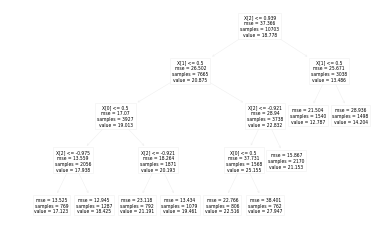

In [711]:
tree.plot_tree(dtree) 
dot_data = tree.export_graphviz(dtree, out_file=None) 
graph = graphviz.Source(dot_data) 
#graph.render("Desktop/titanic") 

In [714]:
dt_score_train = dtree.score(x_train, y_train)
dt_score_test = dtree.score(x_test,y_test)
print("Training Score:")
print (dt_score_train)
print("Testing Score:")
print (dt_score_test)

Training Score:
0.45397858036033845
Testing Score:
0.44569055409624403


In [715]:
pred_dtree=dtree.predict(x_test)

In [716]:
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,pred_dtree)))
print("MAE:",metrics.mean_absolute_error(y_test,pred_dtree))

RMSE: 4.464015170051473
MAE: 3.370937535534786


# 13.Random Forest Regressor

In [698]:
rf_grid = {
    'max_depth': [4, 8, None],
    'max_features': ['sqrt', 'log2', None],
    # 'min_samples_split': [1, 2, 4],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True], # Mandatory with oob_score=True
    'n_estimators': [50, 100, 200, 400],
    'random_state': [67],
    'oob_score': [True],
    'n_jobs': [-1],
    'criterion':['mse','mae']
    }

In [699]:
rfc = GridSearchCV(RandomForestRegressor(), param_grid = rf_grid , cv = 3, verbose=True, n_jobs=-1)
rfc = rfc.fit(x_train,y_train)

Fitting 3 folds for each of 216 candidates, totalling 648 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done 648 out of 648 | elapsed: 20.1min finished


In [700]:
rfc.best_params_

{'bootstrap': True,
 'criterion': 'mse',
 'max_depth': 4,
 'max_features': None,
 'min_samples_leaf': 4,
 'n_estimators': 200,
 'n_jobs': -1,
 'oob_score': True,
 'random_state': 67}

In [701]:
rfc.best_estimator_

RandomForestRegressor(max_depth=4, max_features=None, min_samples_leaf=4,
                      n_estimators=200, n_jobs=-1, oob_score=True,
                      random_state=67)

In [153]:
rfc = RandomForestRegressor(max_depth=4, max_features=None, min_samples_leaf=4,
                      n_estimators=200, n_jobs=-1, oob_score=True,
                      random_state=67)
rfc.fit(x_train, y_train)

RandomForestRegressor(max_depth=4, max_features=None, min_samples_leaf=4,
                      n_estimators=200, n_jobs=-1, oob_score=True,
                      random_state=67)

In [156]:
predictors = ['Age','Gender','Married']

In [157]:
importances=rfc.feature_importances_
importances

array([0.09718542, 0.16068367, 0.74213091])

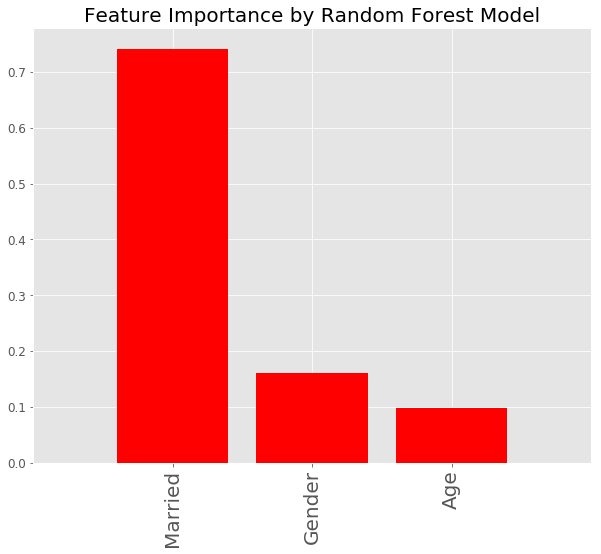

In [159]:
std = np.std([rfc.feature_importances_ for tree in rfc.estimators_],axis=0)
indices = np.argsort(importances)[::-1]
sorted_important_features=[]
for i in indices:
    sorted_important_features.append(predictors[i])
plt.figure(figsize=(10,8))
plt.title("Feature Importance by Random Forest Model", fontsize = 20)
plt.bar(range(np.size(predictors)), importances[indices],color="r", yerr=std[indices], align="center")
plt.xticks(range(np.size(predictors)), sorted_important_features, fontsize = 20, rotation='vertical')
plt.yticks(fontsize = 12)

plt.xlim([-1, np.size(predictors)])
plt.show()

In [717]:
rfc_score_train = rfc.score(x_train, y_train)
rfc_score_test = rfc.score(x_test,y_test)
print("Training Score:")
print (rfc_score_train)
print("testing Score:")
print (rfc_score_test)

Training Score:
0.458133485943073
testing Score:
0.4499212124729778


In [718]:
pred_rf=rfc.predict(x_test)

In [719]:
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,pred_rf)))
print("MAE:",metrics.mean_absolute_error(y_test,pred_rf))

RMSE: 4.446947179522392
MAE: 3.3538927924413593


# 14.Adaboost Regressor

In [720]:
abr_grid={
    'loss':['linear', 'square', 'exponential'],
    'n_estimators': [50, 100, 200, 400],
     'learning_rate': np.arange(0, 1, 0.1)
}

In [721]:
abr = GridSearchCV(AdaBoostRegressor(), param_grid = abr_grid , cv = 3, verbose=True, n_jobs=-1)
abr = abr.fit(x_train,y_train)

Fitting 3 folds for each of 120 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed:   25.6s finished


In [722]:
abr.best_estimator_

AdaBoostRegressor(learning_rate=0.1, loss='exponential')

In [723]:
abr=AdaBoostRegressor(learning_rate=0.1, loss='exponential')
abr.fit(x_train,y_train)

AdaBoostRegressor(learning_rate=0.1, loss='exponential')

In [726]:
pred_abr=abr.predict(x_test)

In [727]:
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,pred_abr)))
print("MAE:",metrics.mean_absolute_error(y_test,pred_abr))

RMSE: 4.575019612240711
MAE: 3.490503315642045


In [728]:
abr_score_train = abr.score(x_train, y_train)
abr_score_test = abr.score(x_test,y_test)
print("Training score:")
print (abr_score_train)
print("Testing score:")
print (abr_score_test)

Training score:
0.4258064688202231
Testing score:
0.4177803268746204


# 15.GradientBoosting Regressor

In [729]:
gbr_grid={
    'loss':['ls','lad','huber','quantile'],
    'n_estimators': [50, 100, 200, 400],
    'learning_rate': np.arange(0, 1, 0.1),
    'criterion':['mse','friedman_mse','mae'],
    'max_leaf_nodes': np.arange(1, 10), 
    'min_samples_split': np.arange(1, 100),
    'max_depth' : np.arange(1, 10),
    'max_features': ['sqrt', 'log2', None]
}

In [680]:
gbr=GradientBoostingRegressor()
gbr.fit(x_train,y_train)

GradientBoostingRegressor()

In [ ]:
gbr = GridSearchCV(GradientBoostingRegressor(), param_grid = gbr_grid , cv = 3, verbose=True, n_jobs=-1)
gbr = gbr.fit(x_train,y_train)

In [681]:
gbr_score_train = gbr.score(x_train, y_train)
gbr_score_test = gbr.score(x_test,y_test)
print (gbr_score_train)
print (gbr_score_test)

0.46004326594753187
0.44920939023926676


# 16.KNN Regressor

In [111]:
knn_grid={
    'n_neighbors':np.arange(0, 20, 1),
    'weights':['uniform','distance']  
}

In [131]:
knn = GridSearchCV(KNeighborsRegressor(), param_grid = knn_grid , cv = 3, verbose=True, n_jobs=-1)
knn = knn.fit(x_train,y_train)

Fitting 3 folds for each of 40 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:    2.8s finished


In [132]:
knn.best_estimator_

KNeighborsRegressor(n_neighbors=19)

In [115]:
knn=KNeighborsRegressor(n_neighbors=19)
knn.fit(x_train,y_train)

KNeighborsRegressor(n_neighbors=19)

In [116]:
knn_score_train = knn.score(x_train, y_train)
knn_score_test = knn.score(x_test,y_test)
print (knn_score_train)
print (knn_score_test)

0.452178833324862
0.42470404841732545


In [117]:
pred_knn=knn.predict(x_test)

In [118]:
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,pred_knn)))
print("MAE:",metrics.mean_absolute_error(y_test,pred_knn))

RMSE: 4.547735324011607
MAE: 3.4517501438581504


In [120]:
error_rate = []

# Will take some time
for i in range(1,20):
    
    knn = KNeighborsRegressor(n_neighbors=i)
    knn.fit(x_train,y_train)
    pred_i = knn.predict(x_test)
    #print(pred_i)
    error_rate.append(np.mean(pred_i !=y.values))

Text(0,0.5,'Error Rate')

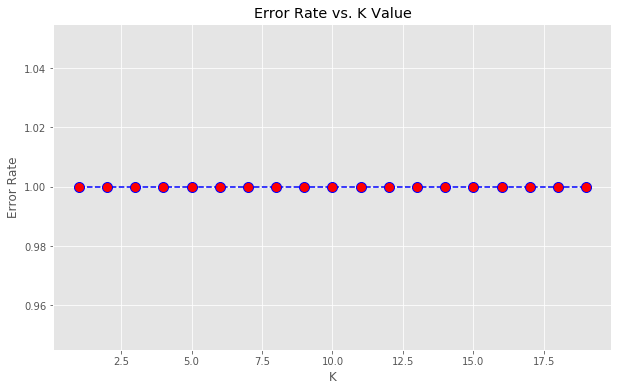

In [122]:
plt.figure(figsize=(10,6))
plt.plot(range(1,20),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

# 17.Support Vector Machine Regressor

In [687]:
svr=SVR()
svr.fit(x_train,y_train)

SVR()

In [688]:
svr_score_train = svr.score(x_train, y_train)
svr_score_test =svr.score(x_test,y_test)
print (svr_score_train)
print (svr_score_test)

0.4247274585425035
0.42387575770113595


# 18.XGB Regressor

In [123]:
xgr_grid={
 "learning_rate"    : np.arange(0, 1, 0.1) ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma"            : np.arange(0, 1, 0.1),
 "colsample_bytree" : np.arange(0, 1, 0.1)   
}

In [124]:
xg_reg = GridSearchCV(xgb.XGBRegressor(objective ='reg:linear'), param_grid = xgr_grid , cv = 3, verbose=True, n_jobs=-1)
xg_reg = xg_reg.fit(x_train,y_train)

Fitting 3 folds for each of 32000 candidates, totalling 96000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:   34.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   59.2s
[Parallel(n_jobs=-1)]: Done 2426 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3176 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 4976 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6026 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 7176 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 8426 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 9776 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 11226 tasks      

[11:57:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[11:57:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


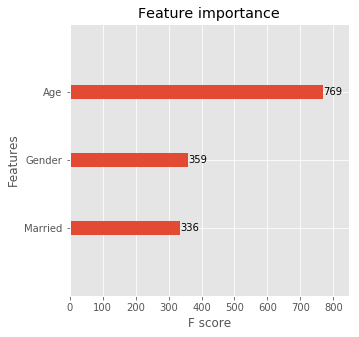

In [149]:
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [5, 5]
plt.show()

In [150]:
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror',max_depth=4)
xg_reg.fit(x_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=4,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [152]:
xg_reg_score_train = xg_reg.score(x_train, y_train)
xg_reg_score_test = xg_reg.score(x_test,y_test)
print("Training score:")
print (xg_reg_score_train)
print("Testingscore:")
print (xg_reg_score_test)

Training score:
0.46505206896629026
Testingscore:
0.44472614231262586


In [145]:
pred_xgb=xg_reg.predict(x_test)

In [146]:
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test,pred_xgb)))
print("MAE:",metrics.mean_absolute_error(y_test,pred_xgb))

RMSE: 4.467896826696311
MAE: 3.376744357992804
